# Prepare the LandSat Image 
Convert from float64 to unit16 & nodata values are set to 0

In [1]:
import os
from coastseg_planet.processing import convert_from_float_to_unit16, create_tiled_raster

# input 
landsat_path = r"C:\development\coastseg-planet\CoastSeg-Planet\landsat\santa_cruz_boardwalk\ID_1_datetime05-21-24__01_55_42\L8\ms\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_ms.tif"
landsat_cloud_mask_path = r"C:\development\coastseg-planet\CoastSeg-Planet\landsat\santa_cruz_boardwalk\ID_1_datetime05-21-24__01_55_42\L8\mask\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_mask.tif"
# Output file path
tmp_path = r"C:\development\coastseg-planet\CoastSeg-Planet\landsat\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_temp.tif"
landsat_processed_path = r"C:\development\coastseg-planet\CoastSeg-Planet\landsat\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_processed.tif"

save_path = r"C:\development\coastseg-planet\CoastSeg-Planet\boardwalk"
# convert the landsat from float to uint16 and change the blocksize to 256x256
tmp_path =convert_from_float_to_unit16(landsat_path, tmp_path)
landsat_processed_path = create_tiled_raster(tmp_path,landsat_processed_path )
# landsat_processed_path = create_tiled_raster(landsat_path,landsat_processed_path )
if os.path.exists(tmp_path):
    os.remove(tmp_path)
landsat_processed_path

output_path: C:\development\coastseg-planet\CoastSeg-Planet\landsat\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_temp.tif
Created a new tiled raster file with block size 256x256 at C:\development\coastseg-planet\CoastSeg-Planet\landsat\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_processed.tif


'C:\\development\\coastseg-planet\\CoastSeg-Planet\\landsat\\2024-03-13-18-45-55_L8_ID_1_datetime05-21-24__01_55_42_processed.tif'

# Filter the Planet Image
- Remove images that are less than 80% of the expected area
- todo: Remove images that are too cloudy

In [2]:
import glob
import os
from coastseg_planet.processing import filter_tiffs_by_area
planet_dir = r"C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files"
tiff_paths = glob.glob(os.path.join(planet_dir,"*AnalyticMS_clip.tif"))
print(f"Number of TIFFs: {len(tiff_paths)}")

# improvement get the planet tiff with the largest area and use that as the expected area
expected_area_km = 4.5  # 4.1 square kilometers
threshold = 0.90

filtered_tiffs = filter_tiffs_by_area(tiff_paths, expected_area_km, threshold, use_threads=True)
print(f"Number of filtered TIFFs: {len(filtered_tiffs)}")
print("Filtered TIFFs:", filtered_tiffs)

Number of TIFFs: 23
Number of filtered TIFFs: 21
Filtered TIFFs: ['C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240316_181004_66_2420_3B_AnalyticMS_clip.tif', 'C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240401_180838_84_24b4_3B_AnalyticMS_clip.tif', 'C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240401_180632_35_24c0_3B_AnalyticMS_clip.tif', 'C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240317_180741_09_2460_3B_AnalyticMS_clip.tif', 'C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240317_180743_00_2460_3B_AnalyticMS_clip.tif', 'C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240408_190149_86_24e0_3B_AnalyticMS_clip.tif', 'C:\\development\\coastseg-planet\\CoastSeg-Planet\\santa_cruz_boardwalk_QGIS\\files\\20240318_185725_57_247d_3B_AnalyticMS_

# Apply Cloud Masks to Planet
Create a cloud and shadow mask for each image in the directory of planet images

In [3]:
from coastseg_planet.masking import apply_cloudmask_to_dir
# apply cloud mask to directory of planet images and generate cloud masks in that directory for each tif
planet_dir = r"C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files"
apply_cloudmask_to_dir(planet_dir)

Creating cloud and shadow mask from C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_udm2_clip.tif
Saving combined mask to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_udm2_clip_combined_mask_bool.tif
Saving combined mask to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_udm2_clip_combined_mask.tif
Creating cloud and shadow mask from C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_udm2_clip.tif
Saving combined mask to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_udm2_clip_combined_mask_bool.tif
Saving combined mask to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_udm2_clip_combined_mask.tif
Creating cloud and shadow mask from C:\develop

# Convert the Planet Images to TOAR if not already TOAR

In [4]:
from coastseg_planet.processing import convert_planet_to_model_format
from coastseg_planet.processing import get_base_filename
from coastseg_planet.processing import TOA_conversion

separator='_3B'
for target_path in filtered_tiffs:
    base_filename = get_base_filename(target_path, separator)
    output_path = os.path.join(planet_dir, f"{base_filename}_TOAR")
    xml_path = glob.glob(os.path.join(planet_dir, f"{base_filename}*AnalyticMS_metadata_clip.xml"))[0]
    print(f"Converting {target_path} to TOAR format and saving to {output_path}")
    # print(f"Using XML file: {xml_path}")
    TOA_conversion(target_path, xml_path, output_path)

Converting C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_AnalyticMS_clip.tif to TOAR format and saving to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_TOAR
Sensor: PSB.SD
Saving to: C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_TOAR_TOA.tif
Converting C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_3B_AnalyticMS_clip.tif to TOAR format and saving to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_TOAR
Sensor: PSB.SD
Saving to: C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_TOAR_TOA.tif
Converting C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180632_35_24c0_3B_AnalyticMS_clip.tif to TOAR format and saving to C:

In [5]:
import rasterio
import numpy as np
from rasterio.plot import show
from coastseg_planet.processing import normalize_band
from skimage.io import imsave
from skimage import img_as_ubyte

def convert_planet_to_model_format(input_file: str, output_file: str) -> None:
    """Process the raster file by normalizing and reordering its bands, and save the output.
    
    This is used for 4 band planet imagery that needs to be reordered to RGBN from BGRN for the zoo model.

    Args:
        input_file (str): The file path to the input raster file.
        output_file (str): The file path to save the processed raster file.
    
    Reads the input raster file, normalizes its bands to the range [0, 255],
    reorders the bands to RGB followed by the remaining bands, and saves the
    processed raster to the specified output file.

    The function assumes the input raster has at least three bands (blue, green, red)
    and possibly additional bands.

    Prints the min and max values of the original and normalized red, green, and blue bands,
    and the shape of the reordered bands array.
    """
    with rasterio.open(input_file) as src:
        # Read the bands
        band1 = src.read(1)  # blue
        band2 = src.read(2)  # green
        band3 = src.read(3)  # red
        other_bands = [src.read(i) for i in range(4, src.count + 1)]

        print(f"red min: {np.min(band3)}, red max: {np.max(band3)}")
        print(f"green min: {np.min(band2)}, green max: {np.max(band2)}")
        print(f"blue min: {np.min(band1)}, blue max: {np.max(band1)}")

        # Normalize the bands
        band1_normalized = normalize_band(band1)
        band2_normalized = normalize_band(band2)
        band3_normalized = normalize_band(band3)
        other_bands_normalized = [normalize_band(band) for band in other_bands]

        print(f"red min: {np.min(band3_normalized)}, red max: {np.max(band3_normalized)}")
        print(f"green min: {np.min(band2_normalized)}, green max: {np.max(band2_normalized)}")
        print(f"blue min: {np.min(band1_normalized)}, blue max: {np.max(band1_normalized)}")

        # Reorder the bands RGB and other bands
        reordered_bands = np.dstack([band3_normalized, band2_normalized, band1_normalized] + other_bands_normalized) # original
        # reordered_bands = np.dstack([ band1_normalized, band2_normalized,band3_normalized] + other_bands_normalized)

        # Get the metadata
        meta = src.meta.copy()

        print(f"dtype: {reordered_bands.dtype}, shape: {reordered_bands.shape}")
        # Update the metadata to reflect the number of layers and data type
        meta.update({
            "count": reordered_bands.shape[2],
            "dtype": reordered_bands.dtype,
            "driver": 'GTiff'
        })
        #make a numpy array that can be saved as a jpg
        im_RGB = reordered_bands[:,:,0:3]
        print(f"im_RGB shape: {im_RGB.shape}")
        im_RGB = img_as_ubyte(im_RGB)
        input_file = input_file.replace('.tif','.jpg')
        fname =input_file.replace('.tif','.jpg')
        print(f"Saving image to {fname}")
        imsave(fname, im_RGB, quality=100)

        # Save the image
        with rasterio.open(output_file, 'w', **meta) as dst:
            for i in range(reordered_bands.shape[2]):
                dst.write(reordered_bands[:, :, i], i + 1)
                

    return output_file

In [6]:
# from coastseg_planet.processing import convert_planet_to_model_format
from coastseg_planet.processing import get_base_filename
from coastseg_planet.processing import TOA_conversion

separator='_3B'
for target_path in filtered_tiffs:
    base_filename = get_base_filename(target_path, separator)
    target_path = os.path.join(planet_dir, f"{base_filename}_TOAR_TOA.tif")
    # the output looks borderline transparent
    output_path = os.path.join(planet_dir, f"{base_filename}_TOAR_new_2.tif")
    output_path= convert_planet_to_model_format(target_path,output_path)
    print(f"Converting to model format and saving to {output_path}")

red min: 0, red max: 5454
green min: 0, green max: 4909
blue min: 0, blue max: 5153
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)
im_RGB shape: (549, 836, 3)
Saving image to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_TOAR_TOA.jpg
Converting to model format and saving to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_TOAR_new_2.tif
red min: 0, red max: 5238
green min: 0, green max: 4558
blue min: 0, blue max: 4864
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)
im_RGB shape: (549, 836, 3)
Saving image to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_TOAR_TOA.jpg
Converting to model format and saving to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\2

In [7]:
from coastseg_planet.processing import convert_planet_to_model_format
from coastseg_planet.processing import get_base_filename
from coastseg_planet.processing import TOA_conversion

separator='_3B'
for target_path in filtered_tiffs:
    base_filename = get_base_filename(target_path, separator)
    target_path = os.path.join(planet_dir, f"{base_filename}_TOAR_TOA.tif")
    # the output looks borderline transparent
    output_path = os.path.join(planet_dir, f"{base_filename}_TOAR_new_2.tif")
    output_path= convert_planet_to_model_format(target_path,output_path)

red min: 0, red max: 5454
green min: 0, green max: 4909
blue min: 0, blue max: 5153
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)
red min: 0, red max: 5238
green min: 0, green max: 4558
blue min: 0, blue max: 4864
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)
red min: 0, red max: 3325
green min: 0, green max: 3268
blue min: 0, blue max: 3321
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)
red min: 0, red max: 5444
green min: 0, green max: 5065
blue min: 0, blue max: 5124
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)
red min: 0, red max: 5432
green min: 0, green max: 5049
blue min: 0, blue max: 5119
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
dtype: uint8, shape: (549, 836, 4)


# Convert Planet Imagery to Same Format as LandSat
- reorder to bands to be  RGBNIR
- scale the values to be 0 - 255 

Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Number of CPUs available: 20
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too sma

Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:04


Found 313 matches.
Performing validity checks...
211 tie points flagged by level 1 filtering (reliability).
90 tie points flagged by level 2 filtering (SSIM).
7 tie points flagged by level 3 filtering (RANSAC)
68 valid tie points remain after filtering.
Visualizing CoReg points grid...


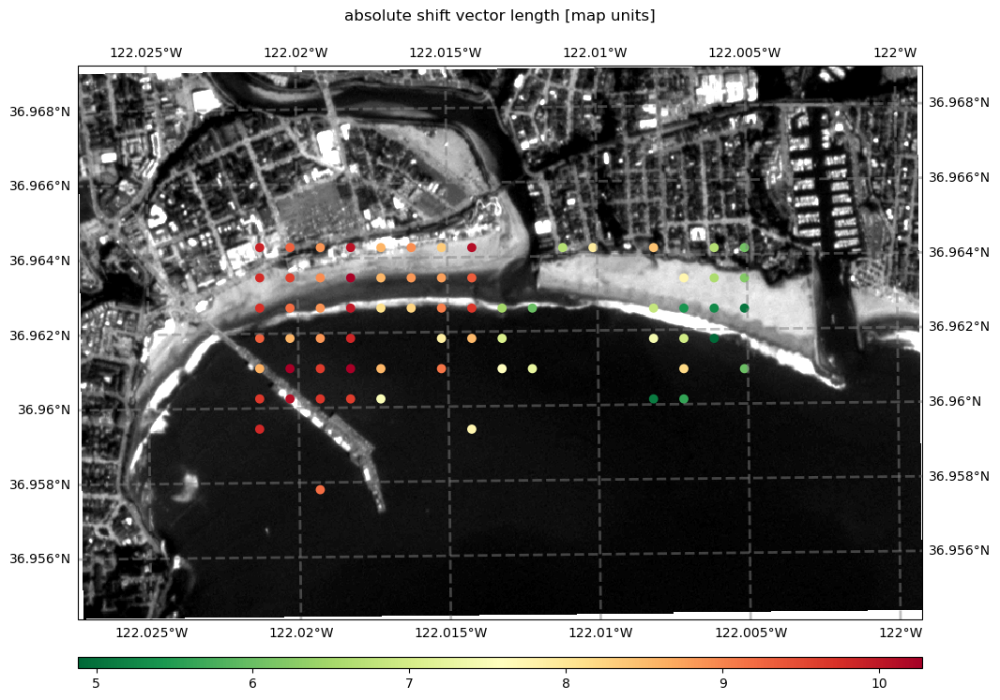

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |====================================--------------| 71.4% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.13s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:02


Found 304 matches.
Performing validity checks...
200 tie points flagged by level 1 filtering (reliability).
96 tie points flagged by level 2 filtering (SSIM).
7 tie points flagged by level 3 filtering (RANSAC)
66 valid tie points remain after filtering.
Visualizing CoReg points grid...


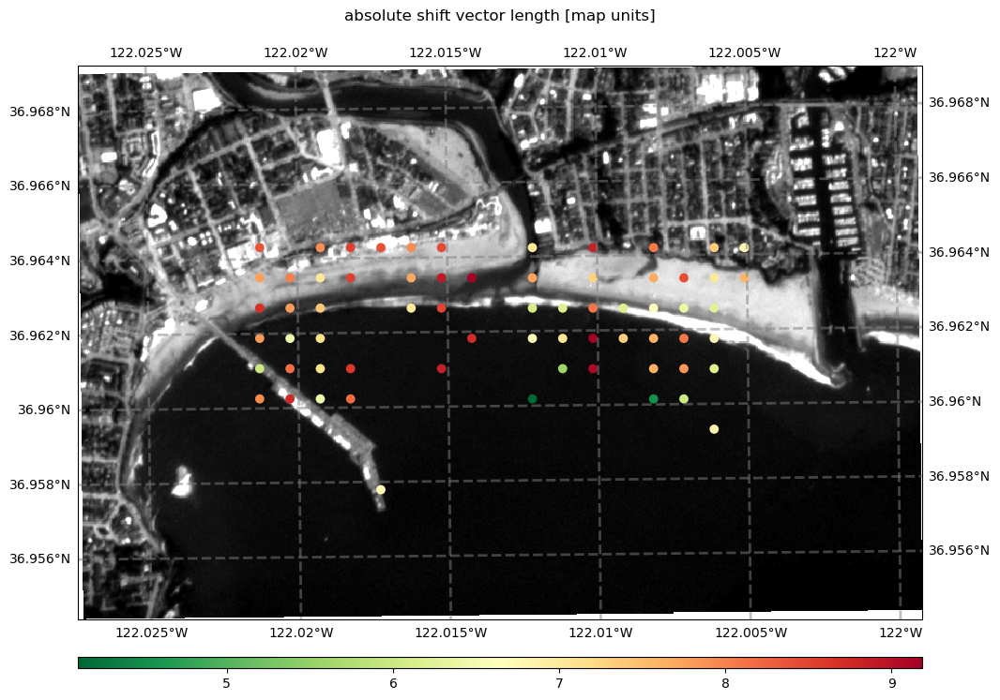

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=========-----------------------------------------| 18.2% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.13s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180632_35_24c0_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(588384.0, 4090275.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.61 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 588817.082488287/4091002.373210962
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (26, 26).


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |=========================================---------| 81.7% Complete  => 0:00:00

Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 102 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |========------------------------------------------| 15.7% Complete  => 0:00:00

Calculating tie point grid (102 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:00


Found 25 matches.
Performing validity checks...
25 tie points flagged by level 1 filtering (reliability).
9 tie points flagged by level 2 filtering (SSIM).
RANSAC skipped because too less valid tie points have been found.
0 valid tie points remain after filtering.
Visualizing CoReg points grid...


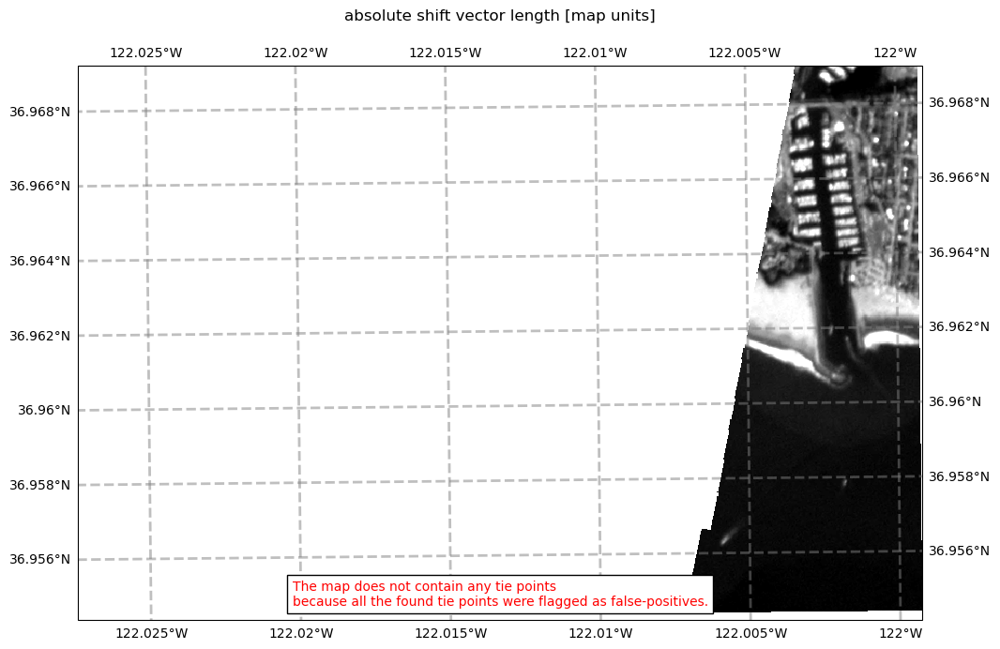

Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |===================================---------------| 69.0% Complete  => 0:00:00

Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180741_09_2460_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |======================================------------| 76.1% Complete  => 0:00:00

Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 313 matches.
Performing validity checks...
203 tie points flagged by level 1 filtering (reliability).
84 tie points flagged by level 2 filtering (SSIM).
10 tie points flagged by level 3 filtering (RANSAC)
74 valid tie points remain after filtering.
Visualizing CoReg points grid...


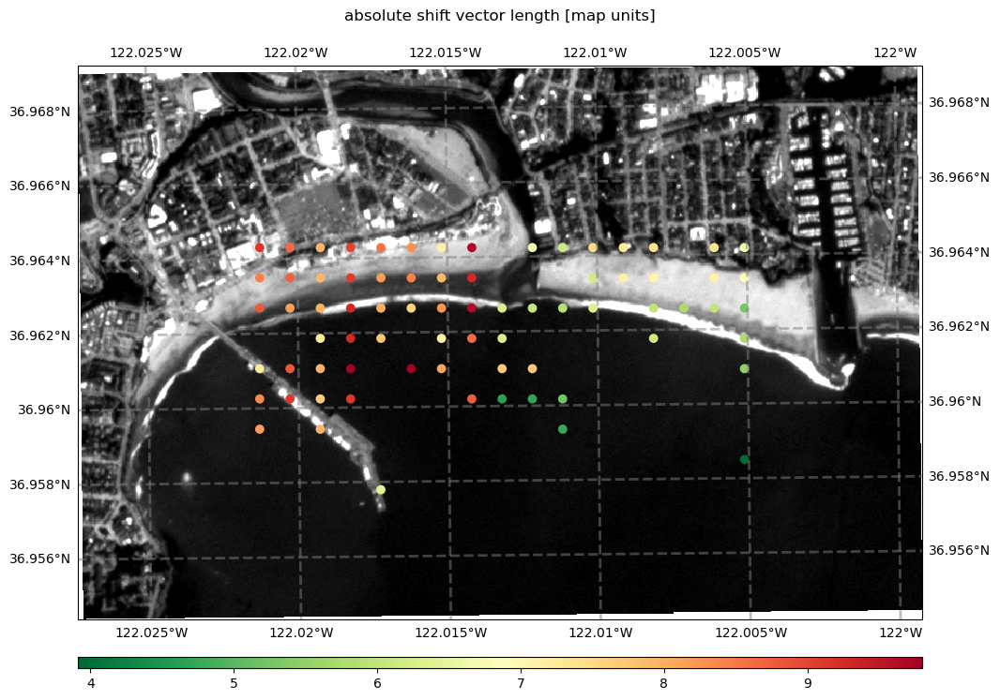

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180741_09_2460_3B_TOAR_processed_coregistered.tif.


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=====================================-------------| 73.1% Complete  => 0:00:00

Time for shift correction: 0.21s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180743_00_2460_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 314 matches.
Performing validity checks...
205 tie points flagged by level 1 filtering (reliability).
81 tie points flagged by level 2 filtering (SSIM).
10 tie points flagged by level 3 filtering (RANSAC)
71 valid tie points remain after filtering.
Visualizing CoReg points grid...


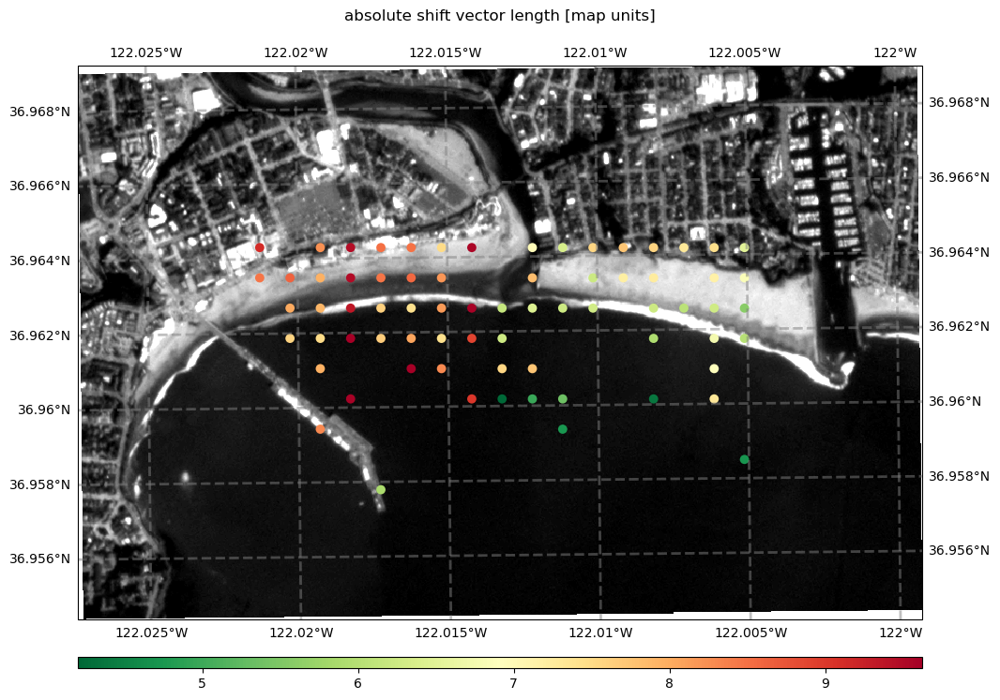

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |====----------------------------------------------| 8.0% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180743_00_2460_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.15s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240408_190149_86_24e0_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 284 matches.
Performing validity checks...
235 tie points flagged by level 1 filtering (reliability).
77 tie points flagged by level 2 filtering (SSIM).
5 tie points flagged by level 3 filtering (RANSAC)
40 valid tie points remain after filtering.
Visualizing CoReg points grid...


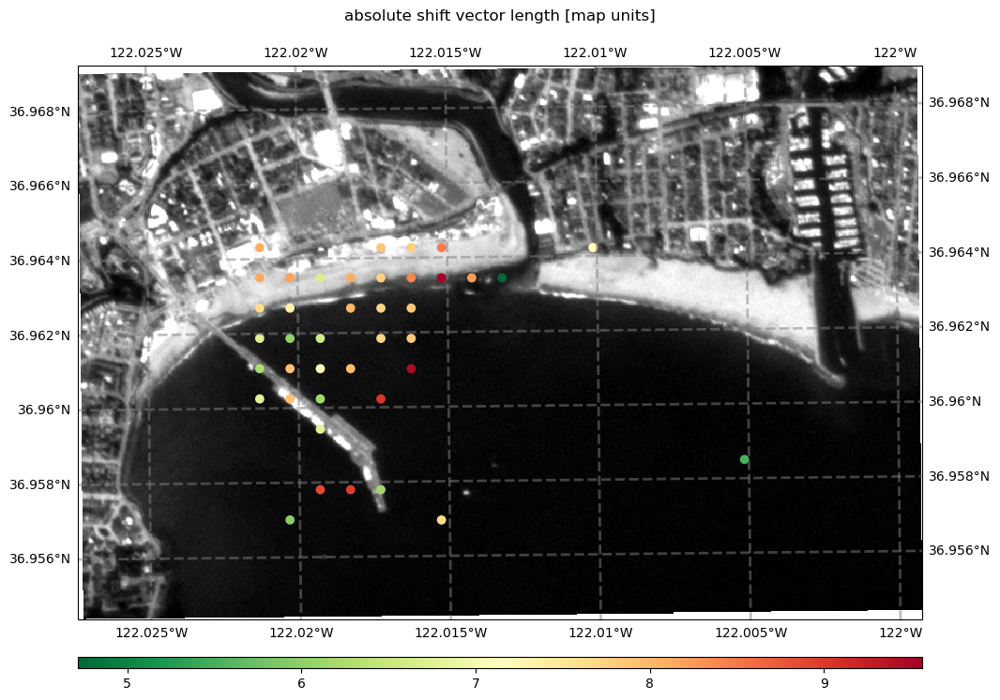

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=======-------------------------------------------| 14.1% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240408_190149_86_24e0_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.14s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240318_185725_57_247d_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================--------------------------------| 35.1% Complete  => 0:00:00

With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...
Error processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240318_185725_57_247d_3B_AnalyticMS_clip.tif: The length of the given lists must be equal to the number of bands. Received a list with 3 items for 'STATISTICS_MAXIMUM'.
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240315_190104_74_24c6_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint

Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 311 matches.
Performing validity checks...
206 tie points flagged by level 1 filtering (reliability).
86 tie points flagged by level 2 filtering (SSIM).
10 tie points flagged by level 3 filtering (RANSAC)
74 valid tie points remain after filtering.
Visualizing CoReg points grid...


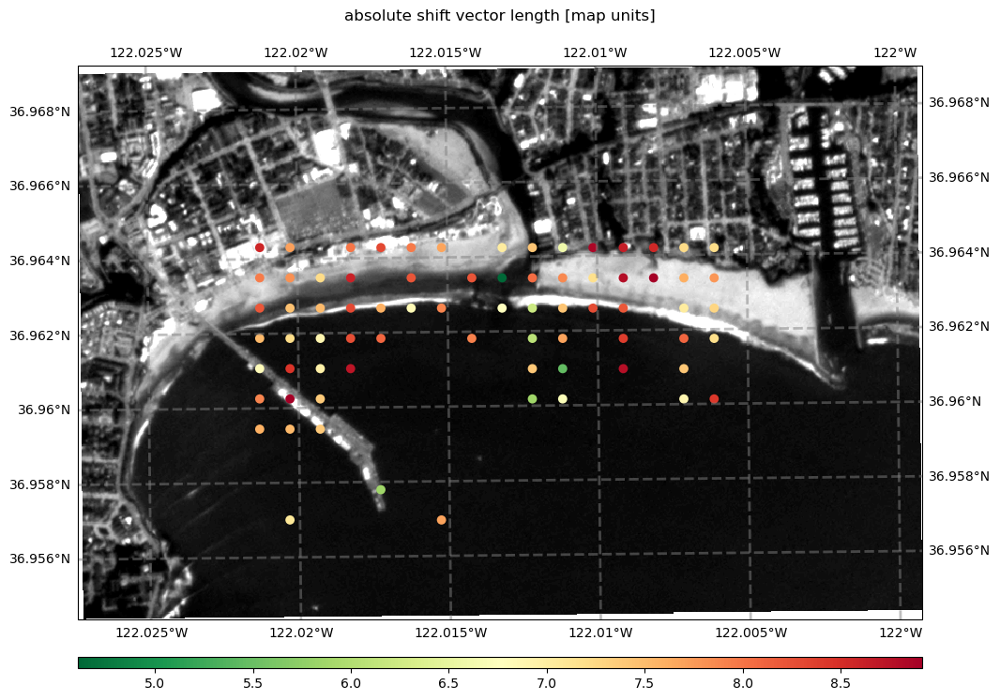

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |--------------------------------------------------| 0.1% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240315_190104_74_24c6_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.18s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180836_68_24b4_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |======--------------------------------------------| 11.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 310 matches.
Performing validity checks...
208 tie points flagged by level 1 filtering (reliability).
71 tie points flagged by level 2 filtering (SSIM).
11 tie points flagged by level 3 filtering (RANSAC)
80 valid tie points remain after filtering.
Visualizing CoReg points grid...


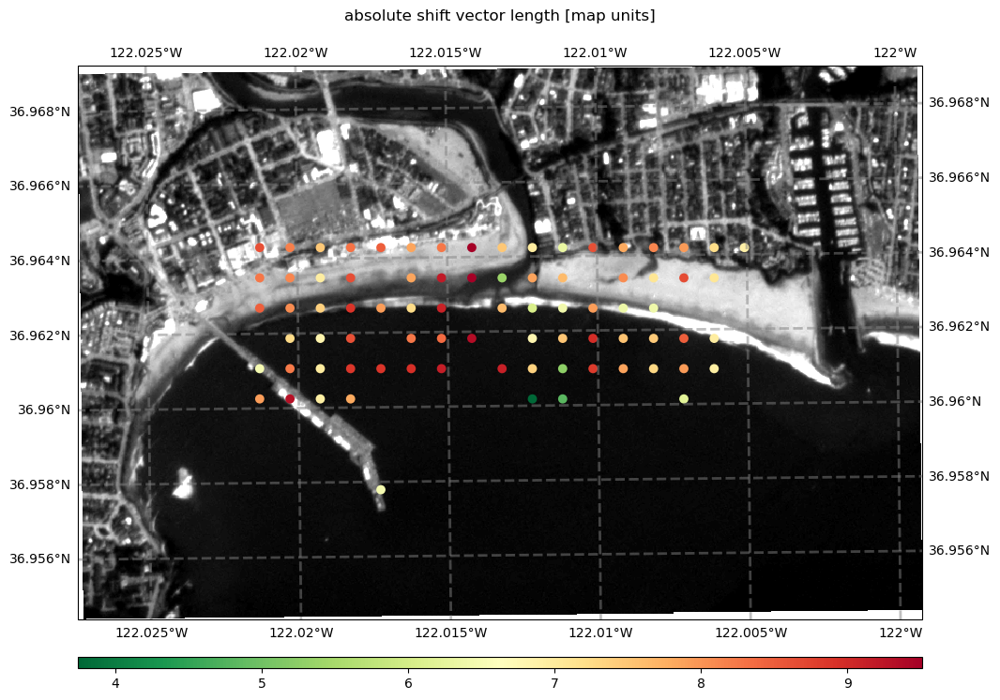

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180836_68_24b4_3B_TOAR_processed_coregistered.tif.


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=============================---------------------| 57.0% Complete  => 0:00:00

Time for shift correction: 0.26s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181002_74_2420_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |======--------------------------------------------| 11.9% Complete  => 0:00:00

Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090815.0, 589089.0, 4091901.0)
resolutions:  15.0 3.0
99.98 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587959.2412705402/4091456.3232520674
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (48, 48).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 246 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.4% Complete  => 0:00:00

Calculating tie point grid (246 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:01


Found 143 matches.
Performing validity checks...
143 tie points flagged by level 1 filtering (reliability).
26 tie points flagged by level 2 filtering (SSIM).
RANSAC skipped because too less valid tie points have been found.
0 valid tie points remain after filtering.
Visualizing CoReg points grid...


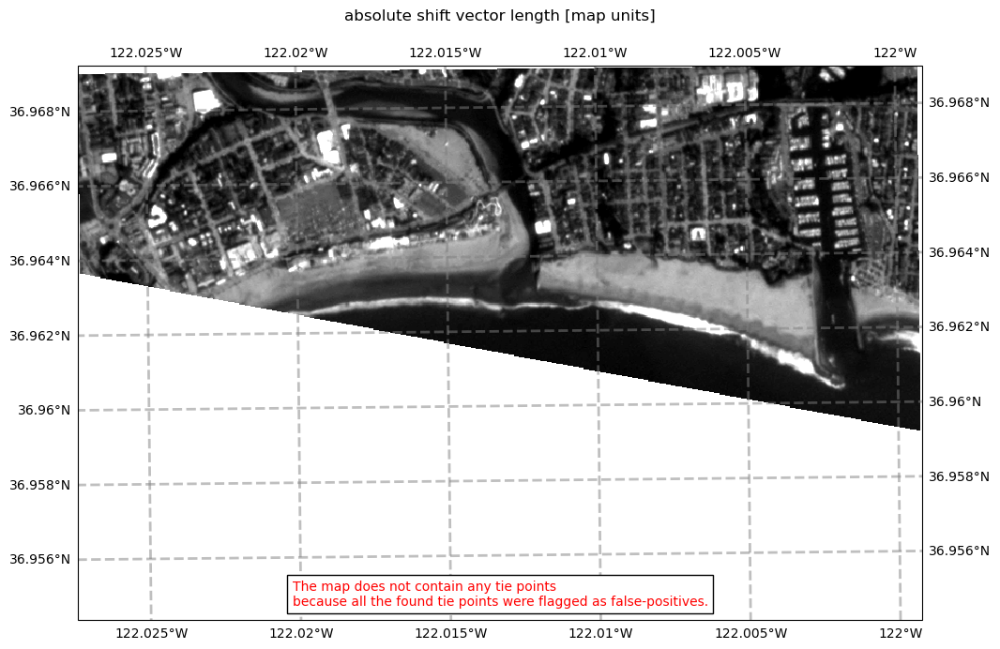

Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=====---------------------------------------------| 9.0% Complete  => 0:00:00

Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182010_48_2432_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |=====================================-------------| 74.3% Complete  => 0:00:00

Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 307 matches.
Performing validity checks...
243 tie points flagged by level 1 filtering (reliability).
80 tie points flagged by level 2 filtering (SSIM).
6 tie points flagged by level 3 filtering (RANSAC)
44 valid tie points remain after filtering.
Visualizing CoReg points grid...


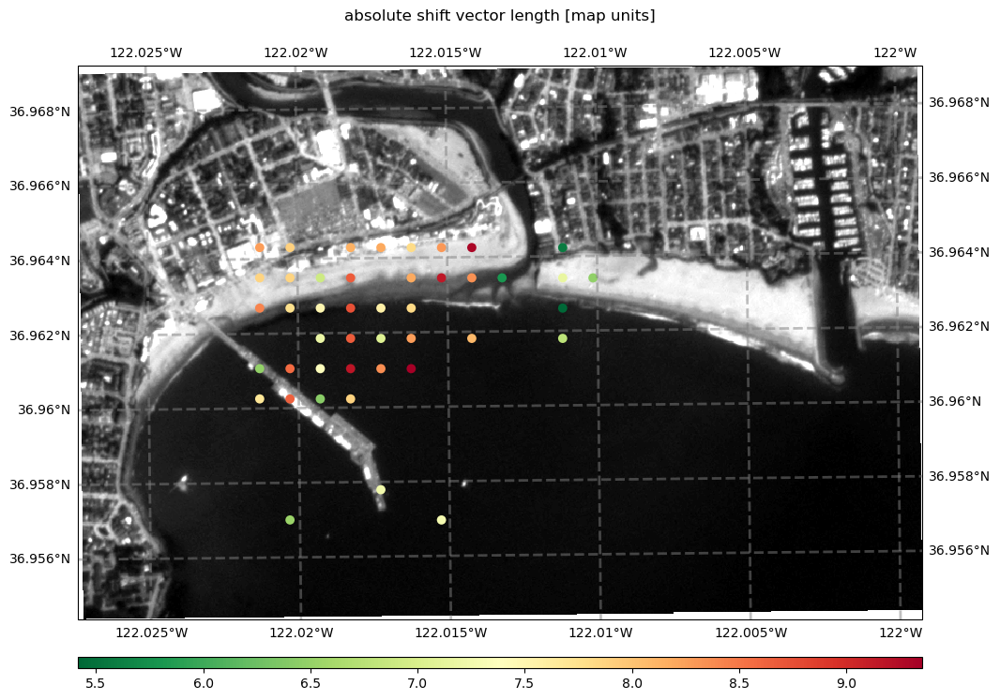

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |--------------------------------------------------| 0.1% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182010_48_2432_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.18s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

With respect to the provided bad data mask(s) 1 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (487 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 337 matches.
Performing validity checks...
270 tie points flagged by level 1 filtering (reliability).
159 tie points flagged by level 2 filtering (SSIM).
4 tie points flagged by level 3 filtering (RANSAC)
33 valid tie points remain after filtering.
Visualizing CoReg points grid...


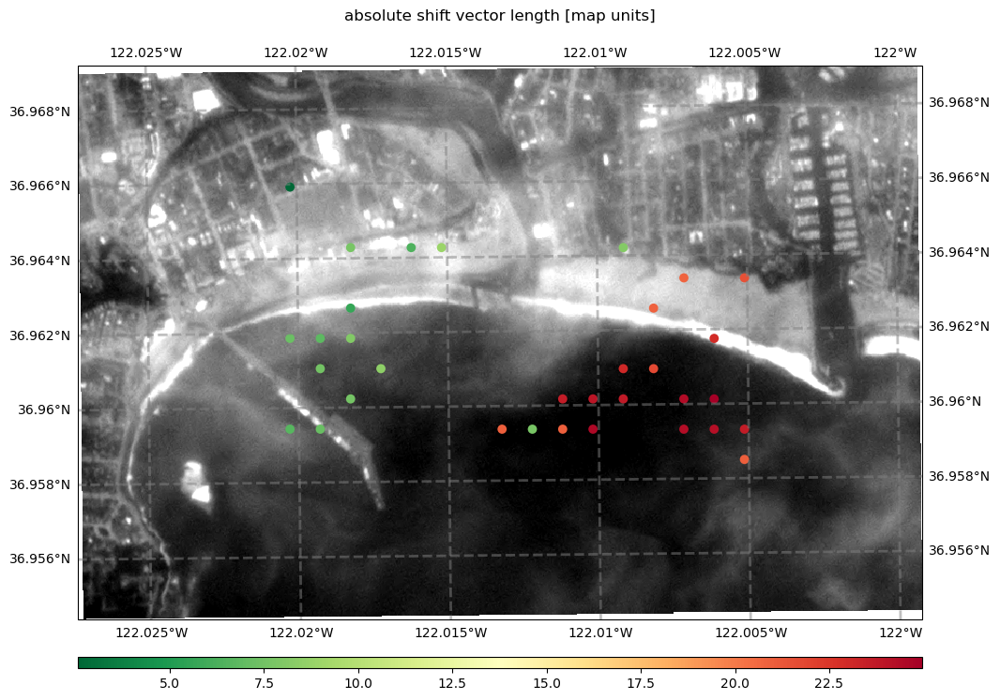

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |======================----------------------------| 44.4% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.14s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_190203_53_24f2_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 312 matches.
Performing validity checks...
216 tie points flagged by level 1 filtering (reliability).
97 tie points flagged by level 2 filtering (SSIM).
9 tie points flagged by level 3 filtering (RANSAC)
72 valid tie points remain after filtering.
Visualizing CoReg points grid...


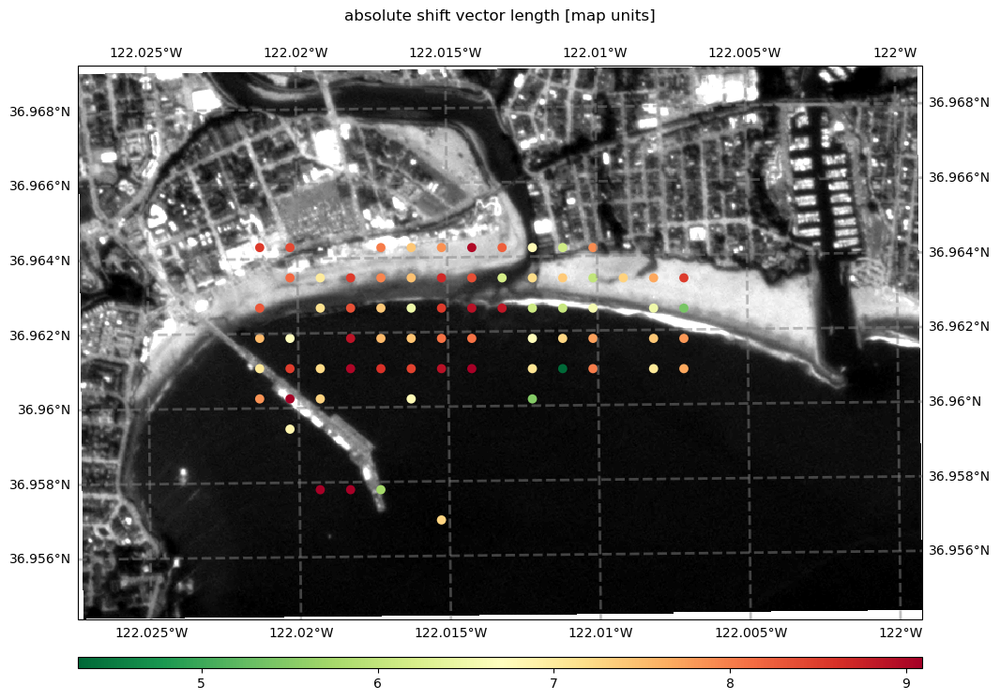

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |===================================---------------| 69.7% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_190203_53_24f2_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.13s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_180644_86_24b6_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |========================--------------------------| 47.7% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 275 matches.
Performing validity checks...
236 tie points flagged by level 1 filtering (reliability).
60 tie points flagged by level 2 filtering (SSIM).
4 tie points flagged by level 3 filtering (RANSAC)
32 valid tie points remain after filtering.
Visualizing CoReg points grid...


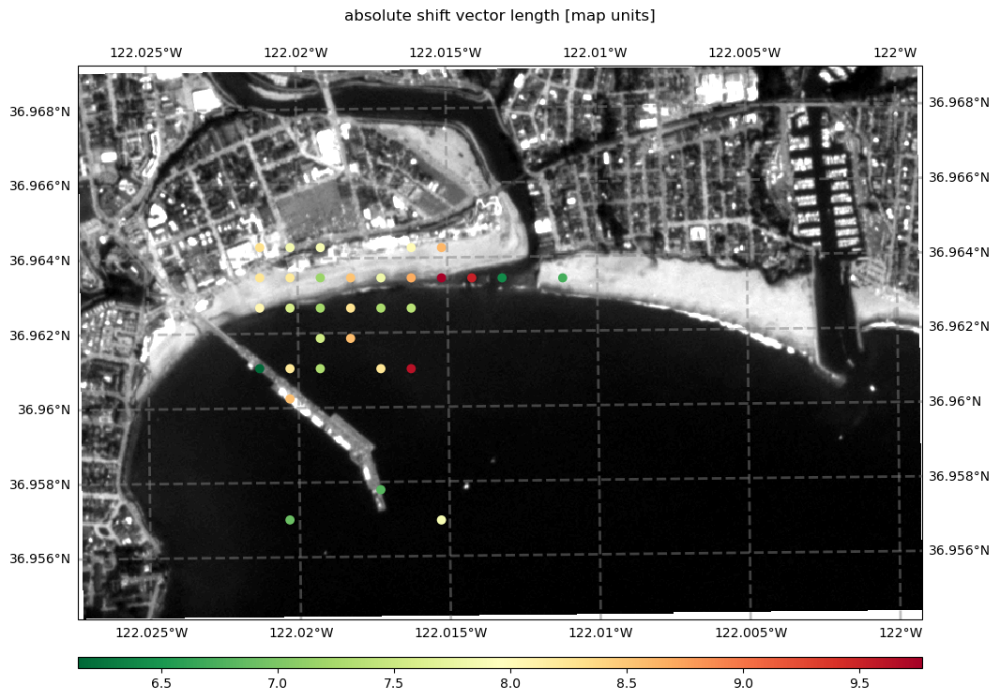

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_180644_86_24b6_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.11s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_181214_28_2459_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 319 matches.
Performing validity checks...
198 tie points flagged by level 1 filtering (reliability).
108 tie points flagged by level 2 filtering (SSIM).
7 tie points flagged by level 3 filtering (RANSAC)
70 valid tie points remain after filtering.
Visualizing CoReg points grid...


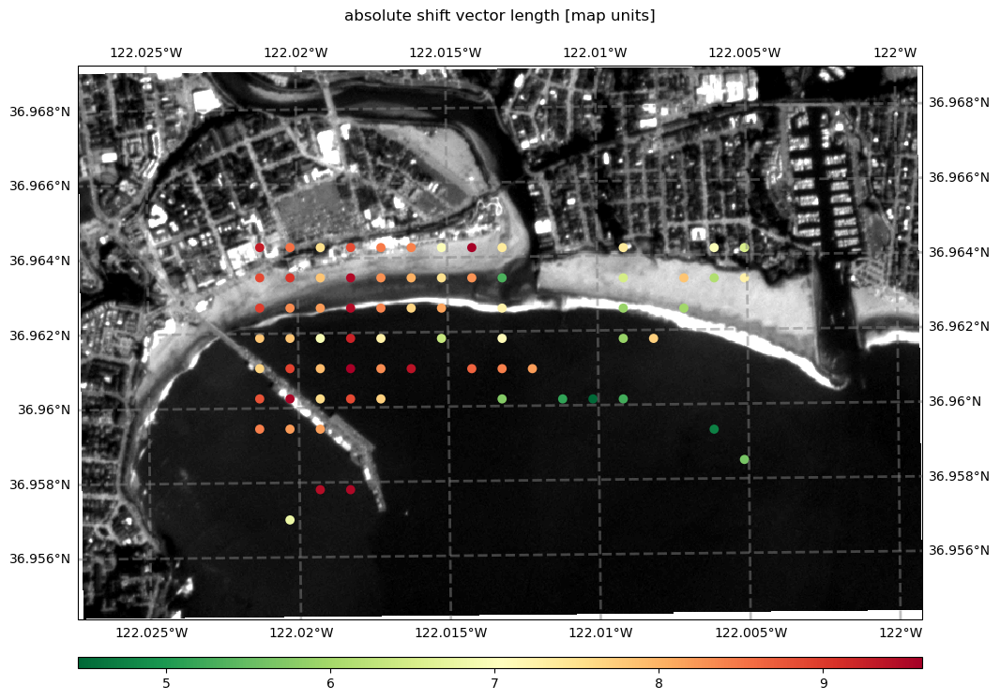

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_181214_28_2459_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.21s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240319_190343_01_24fb_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=================================-----------------| 65.1% Complete  => 0:00:00

Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 315 matches.
Performing validity checks...
208 tie points flagged by level 1 filtering (reliability).
79 tie points flagged by level 2 filtering (SSIM).
9 tie points flagged by level 3 filtering (RANSAC)
82 valid tie points remain after filtering.
Visualizing CoReg points grid...


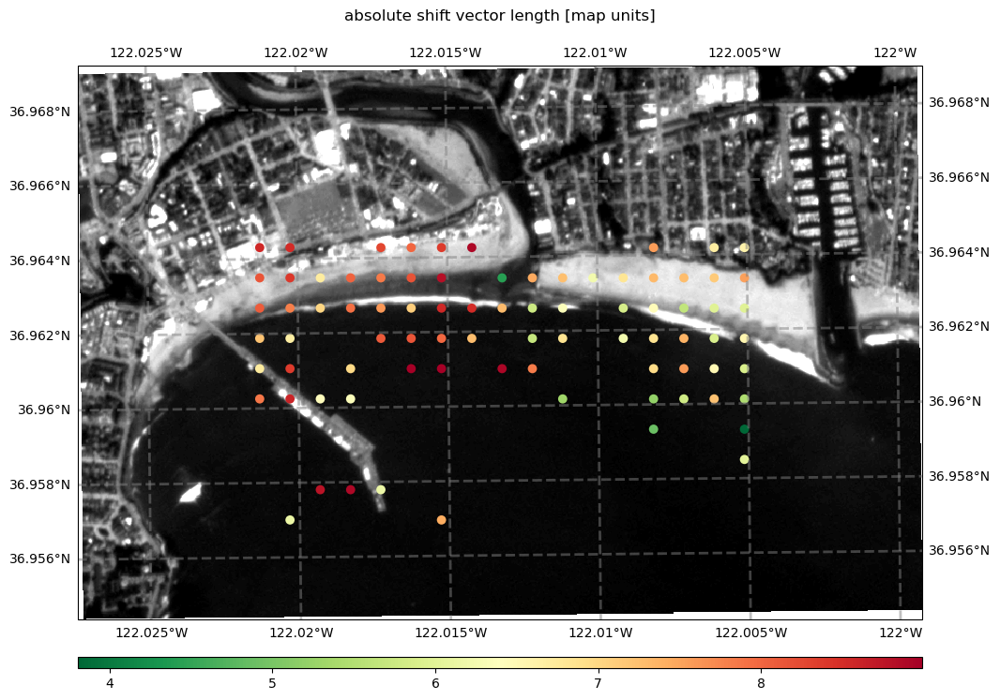

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |===================================---------------| 70.5% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240319_190343_01_24fb_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.12s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |====----------------------------------------------| 7.3% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 2 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (486 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 324 matches.
Performing validity checks...
218 tie points flagged by level 1 filtering (reliability).
98 tie points flagged by level 2 filtering (SSIM).
10 tie points flagged by level 3 filtering (RANSAC)
74 valid tie points remain after filtering.
Visualizing CoReg points grid...


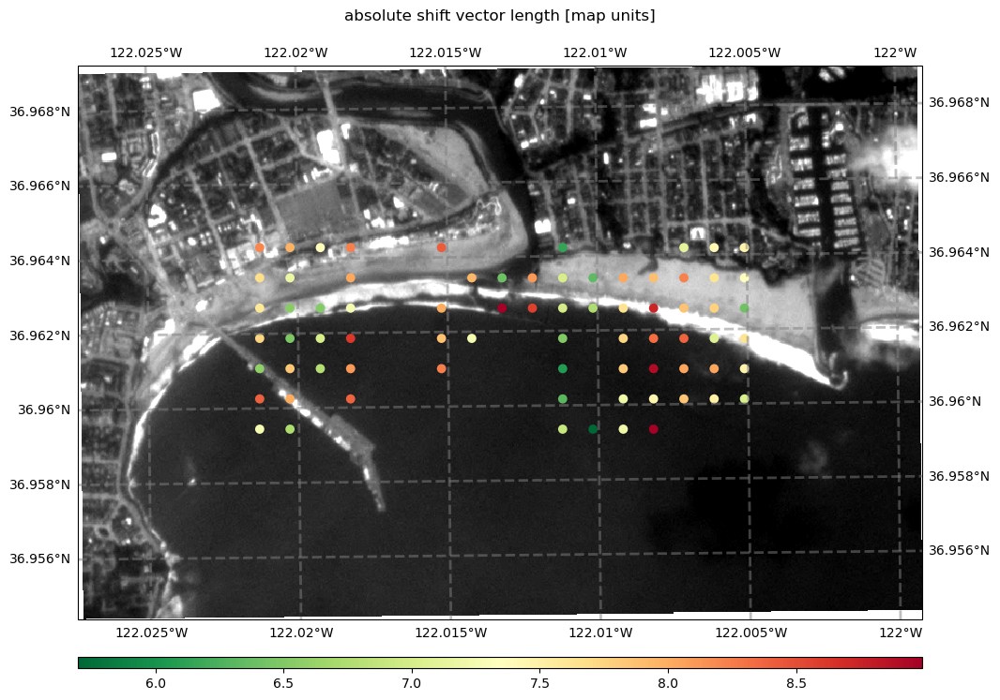

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=================---------------------------------| 33.7% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.14s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182012_35_2432_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 302 matches.
Performing validity checks...
237 tie points flagged by level 1 filtering (reliability).
76 tie points flagged by level 2 filtering (SSIM).
6 tie points flagged by level 3 filtering (RANSAC)
46 valid tie points remain after filtering.
Visualizing CoReg points grid...


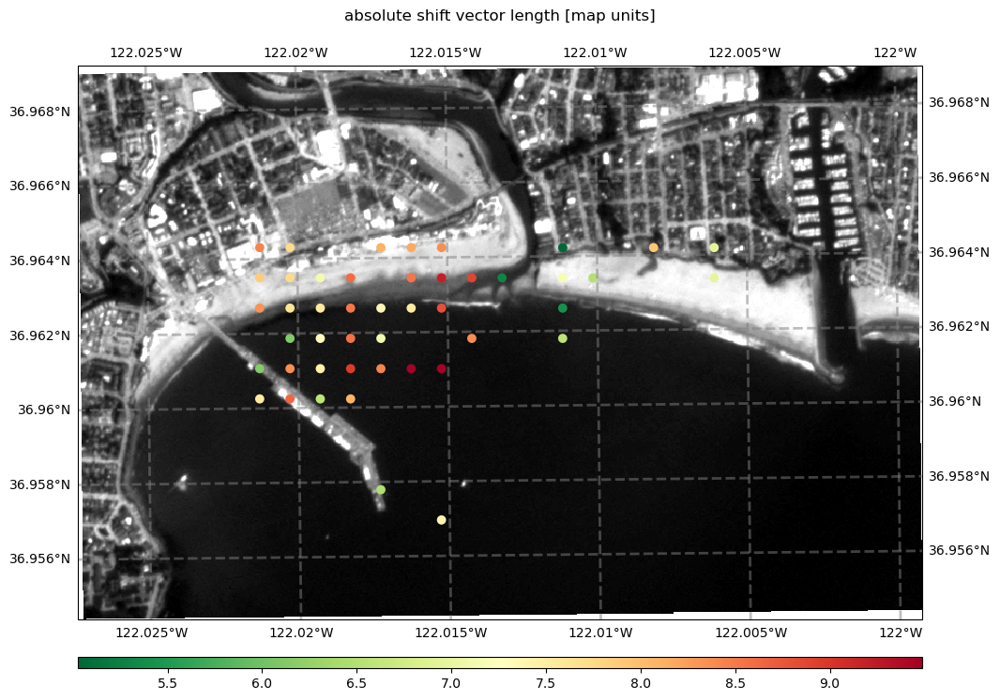

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182012_35_2432_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.21s


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |=========================-------------------------| 49.0% Complete  => 0:00:00

Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_190216_26_24fc_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...
Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |--------------------------------------------------| 0.0% Complete  => 0:00:00

Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 290 matches.
Performing validity checks...
248 tie points flagged by level 1 filtering (reliability).
124 tie points flagged by level 2 filtering (SSIM).
2 tie points flagged by level 3 filtering (RANSAC)
16 valid tie points remain after filtering.
Visualizing CoReg points grid...


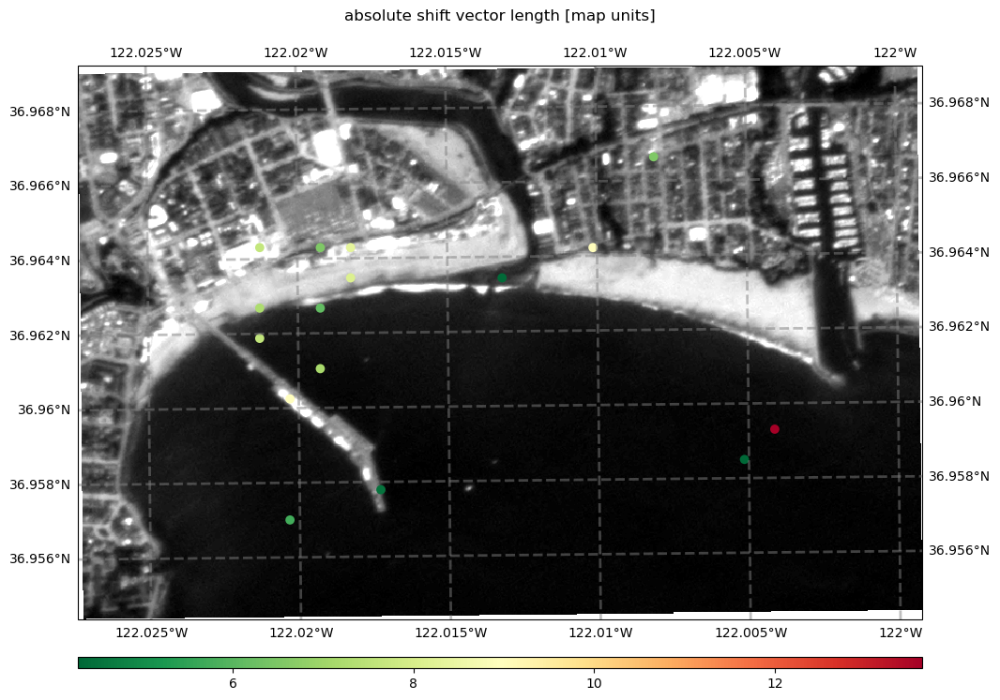

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |===============================-------------------| 61.5% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_190216_26_24fc_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.13s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240410_185931_91_24f3_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00


Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...
Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 300 matches.
Performing validity checks...
249 tie points flagged by level 1 filtering (reliability).
119 tie points flagged by level 2 filtering (SSIM).
2 tie points flagged by level 3 filtering (RANSAC)
20 valid tie points remain after filtering.
Visualizing CoReg points grid...


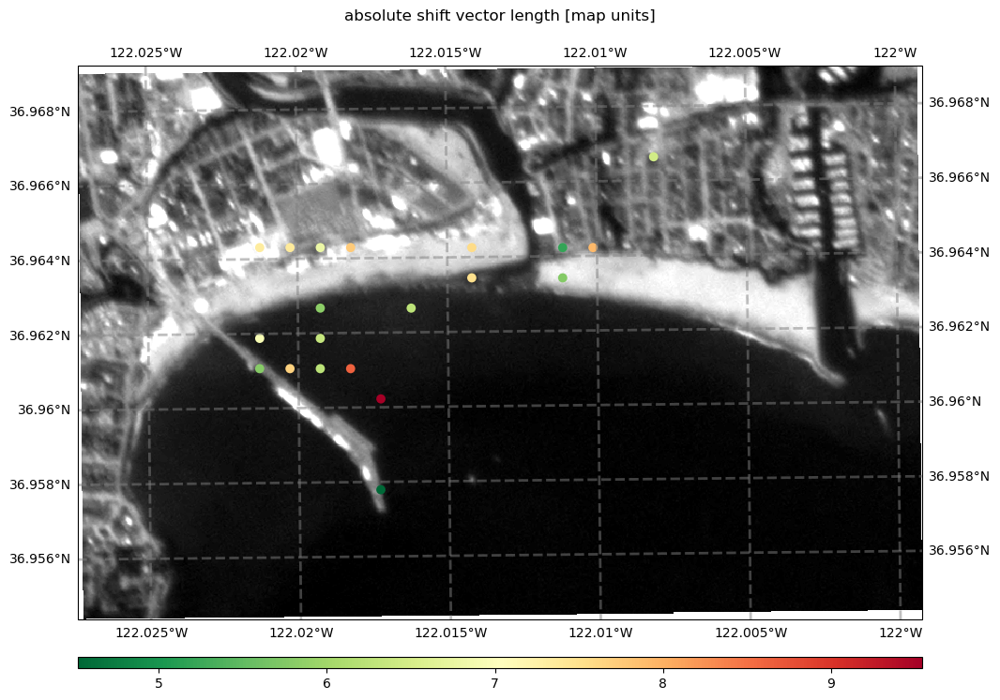

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |============================----------------------| 55.0% Complete  => 0:00:00

Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240410_185931_91_24f3_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.12s
Coregistered planet image saved to: None
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240411_190131_50_24e1_3B_AnalyticMS_clip.tif
Number of CPUs available: 20
{'max_shift': 30, 'align_grids': True, 'grid_res': 30, 'v': True, 'q': False, 'ignore_errors': False, 'progress': True, 'out_crea_options': ['COMPRESS=LZW'], 'fmt_out': 'GTIFF', 'CPUs': 10.0}
Calculating footprint polygon and actual data corner coordinates for reference image...


Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Polygonize progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |===================-------------------------------| 37.6% Complete  => 0:00:00

Bounding box of calculated footprint for reference image:
	(586582.5, 4090252.5, 589087.5, 4091902.5)
Calculating footprint polygon and actual data corner coordinates for image to be shifted...
Bounding box of calculated footprint for image to be shifted:
	(586587.0, 4090254.0, 589095.0, 4091901.0)
resolutions:  15.0 3.0
99.92 percent of the image to be shifted is covered by the reference image.
Matching window position (X,Y): 587840.6848061499/4091078.3293753574
Target window size (256, 256) not possible due to too small overlap area or window position too close to an image edge. New matching window size: (106, 106).
Initializing tie points grid...
With respect to the provided bad data mask(s) 0 points of initially 488 have been excluded.
Equalizing pixel grids and projections of reference and target image...


Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00
	progress: |--------------------------------------------------| 0.2% Complete  => 0:00:00

Calculating tie point grid (488 points) using 10.0 CPU cores...


	progress: |==================================================| 100.0% Complete  => 0:00:03


Found 288 matches.
Performing validity checks...
246 tie points flagged by level 1 filtering (reliability).
76 tie points flagged by level 2 filtering (SSIM).
3 tie points flagged by level 3 filtering (RANSAC)
35 valid tie points remain after filtering.
Visualizing CoReg points grid...


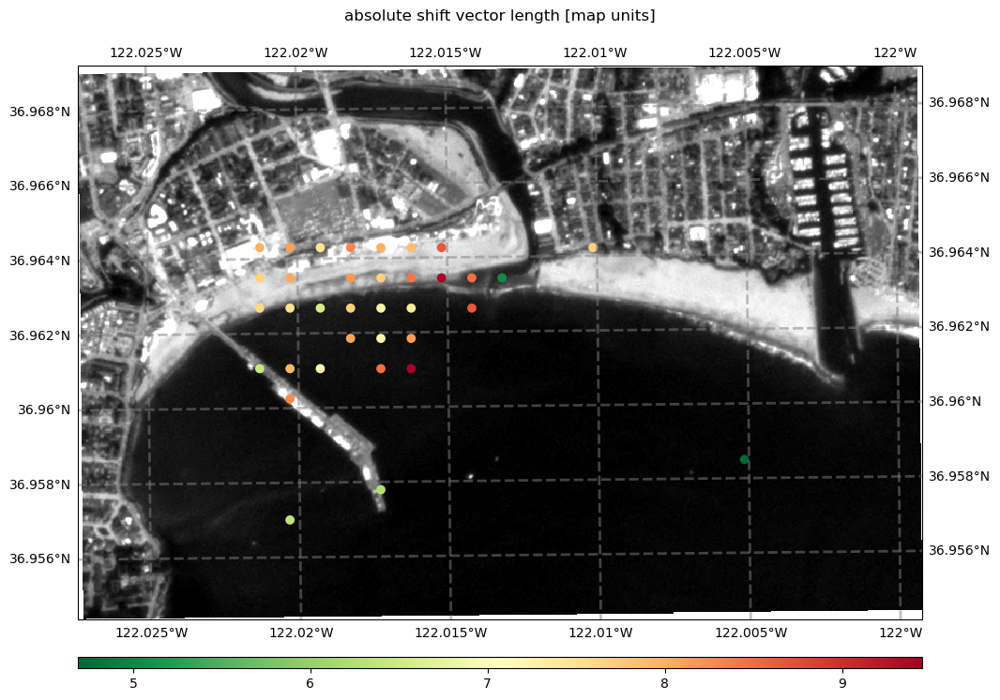

Translating progress |==================================================| 100.0% Complete  => 0:00:00
Warping progress     |==================================================| 100.0% Complete  => 0:00:00


Correcting geometric shifts...
Writing GeoArray of size (548, 835, 4) to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240411_190131_50_24e1_3B_TOAR_processed_coregistered.tif.
Time for shift correction: 0.15s
Coregistered planet image saved to: None


In [8]:
from coastseg_planet.coregister import global_coregister_gw,get_cpus,coregister_arosics_local
from coastseg_planet.processing import get_base_filename
# try to coregister two planet images together that have clouds now that we can mask out clouds

kwargs = {
   'max_shift':30,
   'align_grids':True,
   'grid_res':30, # Grid points are 30 meters apart (the lower this value the longer it takes)
   'v':True, #verbose mode
   'q':False, #quiet mode
   'ignore_errors':False, # Recommended to set to True for batch processing
    'progress':True,
    'out_crea_options':["COMPRESS=LZW"], # otherwise if will use deflate which will not work well with our model
    'fmt_out':'GTIFF',
    'CPUs' : get_cpus()/2,
}

separator='_3B'
for target_path in filtered_tiffs:
    print(f"Processing {target_path}")
    base_filename = get_base_filename(target_path, separator)
    input_path = os.path.join(planet_dir, f"{base_filename}_TOAR_processed.tif")
    # add a function to do this in case the cloud mask is not found
    target_cloud_mask_path = glob.glob(os.path.join(planet_dir, f"{base_filename}*udm2_clip_combined_mask.tif"))[0]
    outfile_path = os.path.join(planet_dir, f"{ base_filename}{separator}_TOAR_processed_coregistered.tif")
    try:
        coregistered_target_path = coregister_arosics_local(input_path,landsat_processed_path, outfile_path, target_cloud_mask = target_cloud_mask_path,**kwargs) 
    except Exception as e:
        print(f"Error processing {target_path}: {e}")
        continue
    print(f"Coregistered planet image saved to: {coregistered_target_path}")

In [9]:
# convert the coregistered planet images to jpgs
separator = '_3B'
for target_path in filtered_tiffs:
    base_filename = get_base_filename(target_path, separator)
    print(f"Processing {base_filename}")
    # get the processed coregistered file, the cloud mask and the npz file
    input_path = os.path.join(planet_dir, f"{base_filename}_3B_TOAR_processed_coregistered.tif")
    if os.path.exists(input_path):
        with rasterio.open(input_path) as src:
            # Read the first three bands
            band1 = src.read(1)
            band2 = src.read(2)
            band3 = src.read(3)
            
            # Stack the bands into a 3D numpy array
            # im_RGB = np.dstack((band1, band2, band3))
            im_RGB = np.dstack((band3, band2, band1))
            print(f"im_RGB shape: {im_RGB.shape}")
            # print the range of values in each band
            print(f"red min: {np.min(band3)}, red max: {np.max(band3)}")
            print(f"green min: {np.min(band2)}, green max: {np.max(band2)}")
            print(f"blue min: {np.min(band1)}, blue max: {np.max(band1)}")
            im_RGB = img_as_ubyte(im_RGB)

            fname =input_path.replace('.tif','.jpg')
            print(f"Saving image to {fname}")
            imsave(fname, im_RGB, quality=100)
        

Processing 20240316_181004_66_2420
im_RGB shape: (548, 835, 3)
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 254
Saving image to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_TOAR_processed_coregistered.jpg
Processing 20240401_180838_84_24b4
im_RGB shape: (548, 835, 3)
red min: 0, red max: 255
green min: 0, green max: 255
blue min: 0, blue max: 255
Saving image to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_3B_TOAR_processed_coregistered.jpg
Processing 20240401_180632_35_24c0
Processing 20240317_180741_09_2460
im_RGB shape: (548, 835, 3)
red min: 0, red max: 255
green min: 0, green max: 254
blue min: 0, blue max: 255
Saving image to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180741_09_2460_3B_TOAR_processed_coregistered.jpg
Processing 20240317_180743_00_2460
im_RGB shape: (548, 835, 3)
red min:

# Apply the Model to the Planet Imagery

In [10]:
from coastseg_planet.shoreline_extraction import get_shorelines_from_model
from coastseg_planet.processing import get_date_from_path,TOA_conversion,get_epsg_from_tiff,get_base_filename,convert_planet_to_model_format
from osgeo import gdal, osr
from datetime import datetime
from coastseg_planet.model import apply_model_to_image
from coastseg.extracted_shoreline import load_image_labels, load_merged_image_labels, remove_small_objects_and_binarize, get_indices_of_classnames, get_class_mapping
from coastseg import file_utilities


# Future improvement will download & load the model from the coastseg_planet package
# for now hard code the model path & weights directory
model_card_path = r'C:\development\coastseg-planet\CoastSeg-Planet\output_zoo\coastseg_planet\coastseg_planet\config\model_card.yml'
weights_directory = r'C:\development\doodleverse\coastseg\CoastSeg\src\coastseg\downloaded_models\segformer_RGB_4class_8190958'
model_card_path = file_utilities.find_file_by_regex(
    weights_directory, r".*modelcard\.json$"
)

out_epsg = get_epsg_from_tiff(landsat_processed_path)
# convert str to int
out_epsg = int(out_epsg)
settings = {
    'output_epsg': out_epsg,
    'min_length_sl': 100,
    'dist_clouds': 50,
    'min_beach_area': 1000,
    'satname': 'planet',
}

separator = '_3B'
for target_path in filtered_tiffs:
    base_filename = get_base_filename(target_path, separator)
    print(f"Processing {base_filename}")
    # get the processed coregistered file, the cloud mask and the npz file
    input_path = os.path.join(planet_dir, f"{base_filename}_3B_TOAR_processed_coregistered.tif")
    cloud_mask_path = glob.glob(os.path.join(planet_dir, f"{base_filename}*udm2_clip_combined_mask.tif"))[0]
    npz_path = os.path.join(planet_dir, f"{base_filename}_3B_TOAR_processed_coregistered_res.npz")
    
    date=get_date_from_path(base_filename)
    print(f"Processing {input_path}")
    print(f"Using cloud mask: {cloud_mask_path}")
    if not os.path.exists(input_path):
        print(f"Skipping {input_path} because it does not exist")
        continue
    
    
    apply_model_to_image(input_path,planet_dir,False,False)
    
    shoreline = get_shorelines_from_model(cloud_mask_path,input_path,model_card_path,npz_path,date,satname= 'planet', settings = settings,save_path=save_path)
    


Version:  2.15.0
Eager mode:  True
32610
Processing 20240316_181004_66_2420
Processing C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_TOAR_processed_coregistered.tif
Using cloud mask: C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_udm2_clip_combined_mask.tif



Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181004_66_2420_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240316_181004_66_2420_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False

saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240316_181004_66_2420_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240316_181004_66_2420_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
      

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180838_84_24b4_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_180838_84_24b4_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_180838_84_24b4_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_180838_84_24b4_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180741_09_2460_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180741_09_2460_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_180741_09_2460_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_180741_09_2460_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_180741_09_2460_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180743_00_2460_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_180743_00_2460_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_180743_00_2460_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_180743_00_2460_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_180743_00_2460_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240408_190149_86_24e0_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240408_190149_86_24e0_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240408_190149_86_24e0_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240408_190149_86_24e0_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240408_190149_86_24e0_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240318_185725_57_247d_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240318_185725_57_247d_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240318_185725_57_247d_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240318_185725_57_247d_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240318_185725_57_247d_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240315_190104_74_24c6_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240315_190104_74_24c6_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240315_190104_74_24c6_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240315_190104_74_24c6_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240315_190104_74_24c6_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180836_68_24b4_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_180836_68_24b4_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_180836_68_24b4_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_180836_68_24b4_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_180836_68_24b4_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181002_74_2420_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240316_181002_74_2420_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240316_181002_74_2420_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240316_181002_74_2420_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240316_181002_74_2420_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182010_48_2432_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182010_48_2432_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240402_182010_48_2432_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240402_182010_48_2432_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240402_182010_48_2432_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_181345_71_242d_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240313_181345_71_242d_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240313_181345_71_242d_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240313_181345_71_242d_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_190203_53_24f2_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240401_190203_53_24f2_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_190203_53_24f2_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_190203_53_24f2_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240401_190203_53_24f2_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_180644_86_24b6_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_180644_86_24b6_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240409_180644_86_24b6_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240409_180644_86_24b6_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240409_180644_86_24b6_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_181214_28_2459_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240317_181214_28_2459_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_181214_28_2459_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_181214_28_2459_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240317_181214_28_2459_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240319_190343_01_24fb_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240319_190343_01_24fb_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240319_190343_01_24fb_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240319_190343_01_24fb_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240319_190343_01_24fb_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240313_180824_31_2423_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240313_180824_31_2423_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240313_180824_31_2423_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240313_180824_31_2423_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182012_35_2432_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240402_182012_35_2432_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240402_182012_35_2432_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240402_182012_35_2432_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240402_182012_35_2432_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_190216_26_24fc_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240409_190216_26_24fc_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240409_190216_26_24fc_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240409_190216_26_24fc_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240409_190216_26_24fc_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240410_185931_91_24f3_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240410_185931_91_24f3_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240410_185931_91_24f3_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240410_185931_91_24f3_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240410_185931_91_24f3_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        

Some layers from the model checkpoint at nvidia/mit-b0 were not used when initializing TFSegformerForSemanticSegmentation: ['classifier']
- This IS expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFSegformerForSemanticSegmentation from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFSegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing image:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240411_190131_50_24e1_3B_TOAR_processed_coregistered.tif
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\20240411_190131_50_24e1_3B_TOAR_processed_coregistered_predseg.png
Output file:  C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240411_190131_50_24e1_3B_TOAR_processed_coregistered_predseg.png
NC: 4, NDB: 3, TS: [512, 512], TTA: False, OT: False
saving segmentation results to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240411_190131_50_24e1_3B_TOAR_processed_coregistered_predseg.png
writing metadata to C:\development\coastseg-planet\CoastSeg-Planet\santa_cruz_boardwalk_QGIS\files\out\20240411_190131_50_24e1_3B_TOAR_processed_coregistered_res.npz
32610
image_epsg: 32610 type: <class 'int'>
inSpatialRef: PROJCS["WGS 84 / UTM zone 10N",
    GEOGCS["WGS 84",
        